In [1]:
import torch
import sys
import numpy as np
sys.path.insert(0, "/myhome/iris")
from src.evaluation.utils import (
    get_device,
    load_ckpt_artifacts
)

In [2]:
# model trained on all focal planes
ckpt_path = "/myhome/iris/lightning_logs/cnet_experiment_polygon_projection-20251120-152638/cnet_cell_cycle/ngbsivhn/checkpoints/epoch140-val_loss6.0552.ckpt"

# model trained on middle focal plane
ckpt_path = "/myhome/iris/lightning_logs/full_dataset-20251217-212156/cell-cycle-loeo/4erwbzxy/checkpoints/epoch99-val_loss0.0214.ckpt"

model, loader, projector = load_ckpt_artifacts(ckpt_path, split="val")
device = get_device()
model = model.to(device)

Loading checkpoint from: /myhome/iris/lightning_logs/full_dataset-20251217-212156/cell-cycle-loeo/4erwbzxy/checkpoints/epoch99-val_loss0.0214.ckpt

Setting up ModularCellDataModule

Creating feature transform pipeline
   - Using [{'class_path': 'sklearn.preprocessing.StandardScaler', 'init_args': {}}] transforms

Creating image transform pipeline
   - Using [] transforms

Creating data source from: /myhome/iris/data/fucci_3t3_221124_filtered_noNG030JP208_with_nuclei_seg.h5
   ✓ Found 22,677 total cells

Applying quality filters:
   - Plane count: 3
   - Max objects: 1
   - Min segmentation pixels: 10
   - Max nuclei outside ratio: 0.2
   - Allowed exp_ids: None
   - Excluded exp_ids: ['NG012']
   - Filtering known duplicate cells: enabled
✓ Loaded filter results from cache: /myhome/iris/data/fucci_3t3_221124_filtered_noNG030JP208_with_nuclei_seg_filtered_9167a645.json

FILTERING STATISTICS
Total cells:                22,677
Valid cells:                16,759
Invalid cells:             

### Feature Visualization with PCA + UMAP/Phate

Extract flattened features after average pooling from CNet and visualize them using dimensionality reduction (PCA → UMAP/Phate)

In [3]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import phate
import umap
from tqdm import tqdm

# Extract features after global pooling
def extract_pooled_features(model, loader, max_batches=None):
    """
    Extract flattened features after average pooling from CNet.
    
    Returns:
        features: numpy array of shape [N, feature_dim]
        labels: numpy array of shape [N,]
        predictions: numpy array of shape [N,]
    """
    model.eval()
    all_features = []
    all_labels = []
    all_predictions = []
    
    # Hook to capture features after global pooling
    pooled_features = []
    
    def hook_fn(module, input, output):
        # Global pool output is [B, C] after flattening
        pooled_features.append(output.detach().cpu())
    
    # Register hook on global_pool layer
    hook = model.fc[0].register_forward_hook(hook_fn)
    
    try:
        with torch.no_grad():
            for batch_idx, batch in enumerate(tqdm(loader, desc="Extracting features")):
                if max_batches and batch_idx >= max_batches:
                    break
                
                images, labels = batch
                features = None
                if isinstance(images, (list, tuple)):
                    images, features = images  # Unpack if needed
                    features = features.to(device)
                inputs = images.to(device)
                
                # Forward pass (hook will capture pooled features)
                if features is not None:
                    predictions = model(inputs, features)
                else:
                    predictions = model(inputs)
                
                # Get the captured features
                # features = np.concatenate([pooled_features[-1].cpu().numpy().squeeze(), features.cpu().numpy()], axis=1)  # [B, C]
                features = pooled_features[-1].cpu().numpy().squeeze()  # [B, C]
                all_features.append(features)
                all_labels.append(labels.cpu().numpy())
                all_predictions.append(predictions.cpu().numpy())
        
        # Concatenate all batches
        features = np.concatenate(all_features, axis=0)
        labels = np.concatenate(all_labels, axis=0)
        predictions = np.concatenate(all_predictions, axis=0)
    finally:
        # Remove hook
        hook.remove()
    
    return features, labels, predictions

use_cache = False
features_path = "/myhome/iris/src/evaluation/features.npy"
labels_path = "/myhome/iris/src/evaluation/labels.npy"
predictions_path = "/myhome/iris/src/evaluation/predictions.npy"

# Extract features from test set
print("Extracting pooled features from CNet...")
if use_cache:
    features = np.load(features_path)
    labels = np.load(labels_path)
    predictions = np.load(predictions_path)
else:
    features, labels, predictions = extract_pooled_features(
        model, 
        loader, 
        max_batches=None  # Adjust based on how many samples you want
    )

print(f"Extracted features shape: {features.shape}")
print(f"Labels shape: {labels.shape}")
print(f"Predictions shape: {predictions.shape}")

Extracting pooled features from CNet...


Extracting features: 100%|██████████| 27/27 [04:08<00:00,  9.21s/it]

Extracted features shape: (1676, 256)
Labels shape: (1676, 1)
Predictions shape: (1676, 1)


Applying PCA to reduce from 256 to 50 dimensions...
PCA explained variance: 99.67%
PCA-reduced features shape: (1676, 50)


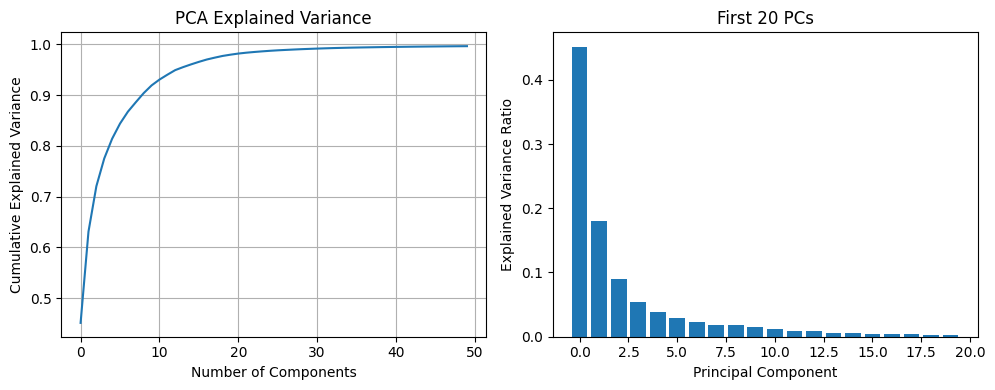

In [4]:
# Step 1: Apply PCA for initial dimensionality reduction (faster runtime for UMAP/t-SNE)
n_pca_components = 50  # Reduce to 50 dims first (adjust based on your feature dim)
print(f"Applying PCA to reduce from {features.shape[1]} to {n_pca_components} dimensions...")

pca = PCA(n_components=n_pca_components, random_state=42)
features_pca = pca.fit_transform(features)

explained_variance = np.sum(pca.explained_variance_ratio_)
print(f"PCA explained variance: {explained_variance:.2%}")
print(f"PCA-reduced features shape: {features_pca.shape}")

# Plot PCA explained variance
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('PCA Explained Variance')
plt.grid(True)

plt.subplot(1, 2, 2)
plt.bar(range(min(20, n_pca_components)), pca.explained_variance_ratio_[:20])
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('First 20 PCs')
plt.tight_layout()
plt.show()

In [5]:
# Step 2: Apply UMAP for 2D visualization
# feature_pca = np.concatenate((features_pca, labels), axis = 1)

print("Applying UMAP for 2D embedding...")
reducer_umap = umap.UMAP(
    n_components=2,
    n_neighbors=15,
    min_dist=0.1,
    metric='euclidean',
    random_state=42
)
umap_embedding = reducer_umap.fit_transform(features_pca)

reducer_phate = phate.PHATE(knn=15, random_state=42)
phate_embedding = reducer_phate.fit_transform(features_pca)

print(f"2D embedding shape UMAP: {umap_embedding.shape}")

Applying UMAP for 2D embedding...


/opt/conda/envs/iris_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Calculating PHATE...
  Running PHATE on 1676 observations and 50 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 0.21 seconds.
    Calculating affinities...
    Calculated affinities in 0.97 seconds.
  Calculated graph and diffusion operator in 1.19 seconds.
  Calculating optimal t...
    Automatically selected t = 13
  Calculated optimal t in 1.87 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.49 seconds.
  Calculating metric MDS...
    SGD-MDS may not have converged: stress changed by -1.5% in final iterations. Consider increasing n_iter or adjusting learning_rate.
  Calculated metric MDS in 2.63 seconds.
Calculated PHATE in 6.24 seconds.
2D embedding shape UMAP: (1676, 2)


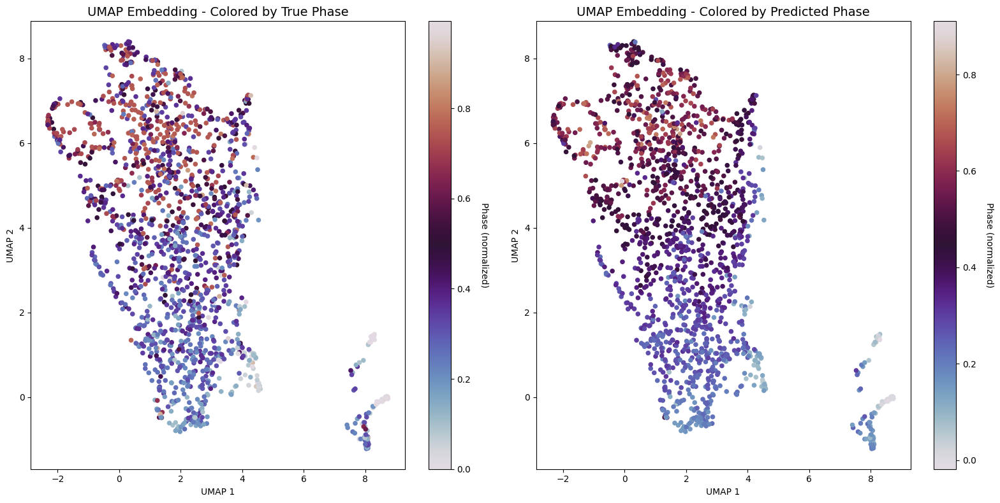


Embedding Statistics:
Number of samples: 1676
Mean geodesic error: -0.0125
Median geodesic error: -0.0032
Max geodesic error: 0.4941


In [19]:
# Step 3: Visualize the embeddings colored by phase labels
import matplotlib.pyplot as plt
import matplotlib.cm as cm

labels = labels.squeeze()

predictions_normalized = predictions.squeeze()
if predictions_normalized.max() > 1:
    predictions_normalized = predictions_normalized % 1.0

# Create figure with multiple subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# 1. Color by true phase labels
ax = axes[0]
scatter = ax.scatter(
    umap_embedding[:, 0], 
    umap_embedding[:, 1], 
    c=labels,
    cmap='twilight',  # Circular colormap for phase
    s=20,
    alpha=1.0
)
ax.set_title(f'UMAP Embedding - Colored by True Phase', fontsize=14)
ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Phase (normalized)', rotation=270, labelpad=20)

# 2. Color by predicted phase
ax = axes[1]
scatter = ax.scatter(
    umap_embedding[:, 0], 
    umap_embedding[:, 1], 
    c=predictions_normalized,
    cmap='twilight',
    s=20,
    alpha=1.0
)
ax.set_title(f'UMAP Embedding - Colored by Predicted Phase', fontsize=14)
ax.set_xlabel('UMAP 1')
ax.set_ylabel('UMAP 2')
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Phase (normalized)', rotation=270, labelpad=20)

plt.tight_layout()
plt.show()

# Print statistics
print(f"\nEmbedding Statistics:")
print(f"Number of samples: {len(umap_embedding)}")
print(f"Mean geodesic error: {np.mean(errors):.4f}")
print(f"Median geodesic error: {np.median(errors):.4f}")
print(f"Max geodesic error: {np.max(errors):.4f}")

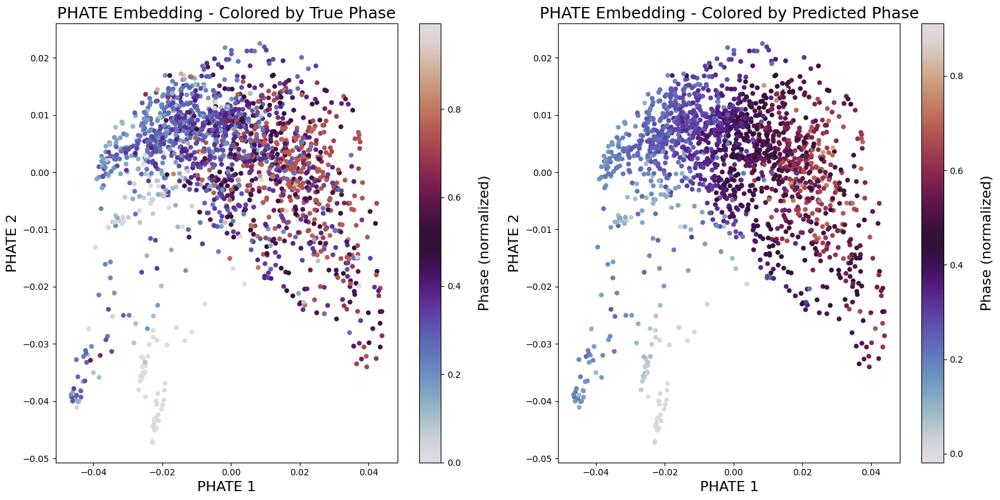

In [24]:
# Step 3: Visualize the embeddings colored by phase labels
import matplotlib.pyplot as plt
import matplotlib.cm as cm

labels = labels.squeeze()

predictions_normalized = predictions.squeeze()
if predictions_normalized.max() > 1:
    predictions_normalized = predictions_normalized % 1.0
    
# Create figure with multiple subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 8))

# 1. Color by true phase labels
ax = axes[0]
scatter = ax.scatter(
    phate_embedding[:, 0], 
    phate_embedding[:, 1], 
    c=labels,
    cmap='twilight',  # Circular colormap for phase
    s=20,
    alpha=1.0
)
ax.set_title(f'PHATE Embedding - Colored by True Phase', fontsize=18)
ax.set_xlabel('PHATE 1', fontsize=16)
ax.set_ylabel('PHATE 2', fontsize=16)
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Phase (normalized)', rotation=90, labelpad=20, fontsize=16)

# 2. Color by predicted phase
ax = axes[1]
scatter = ax.scatter(
    phate_embedding[:, 0], 
    phate_embedding[:, 1], 
    c=predictions_normalized,
    cmap='twilight',
    s=20,
    alpha=1.0
)
ax.set_title(f'PHATE Embedding - Colored by Predicted Phase', fontsize=18)
ax.set_xlabel('PHATE 1', fontsize=16)
ax.set_ylabel('PHATE 2', fontsize=16)
cbar = plt.colorbar(scatter, ax=ax)
cbar.set_label('Phase (normalized)', rotation=90, labelpad=20, fontsize=16)

plt.tight_layout()
plt.show()

In [14]:
# Optional: Interactive 3D visualization (if you want to explore in 3D)
# Uncomment to create a 3D UMAP/t-SNE embedding

# if method == 'umap' and has_umap:
#     print("Creating 3D UMAP embedding...")
#     reducer_3d = umap.UMAP(n_components=3, n_neighbors=15, min_dist=0.1, random_state=42)
#     embedding_3d = reducer_3d.fit_transform(features_pca)
# else:
#     print("Creating 3D t-SNE embedding...")
#     tsne_3d = TSNE(n_components=3, perplexity=30, random_state=42, verbose=1)
#     embedding_3d = tsne_3d.fit_transform(features_pca)

# # 3D scatter plot
# from mpl_toolkits.mplot3d import Axes3D
# fig = plt.figure(figsize=(12, 10))
# ax = fig.add_subplot(111, projection='3d')
# scatter = ax.scatter(
#     embedding_3d[:, 0],
#     embedding_3d[:, 1],
#     embedding_3d[:, 2],
#     c=labels_normalized,
#     cmap='twilight',
#     s=20,
#     alpha=0.6
# )
# ax.set_title(f'3D {method.upper()} Embedding - Colored by Phase')
# ax.set_xlabel(f'{method.upper()} 1')
# ax.set_ylabel(f'{method.upper()} 2')
# ax.set_zlabel(f'{method.upper()} 3')
# plt.colorbar(scatter, ax=ax, label='Phase (normalized)')
# plt.show()

### PCI

In this section we want to investigate how much added informatioin the 2 other focal planes besides the middle one provide using permutation channel importance (PCI)

Computing PCI: 100%|██████████| 53/53 [02:34<00:00,  2.91s/it]


Baseline MSE: 0.029654303261182915
Permuted MSE Focal Plane 1: 0.2027507228946974
Permuted MSE Focal Plane 2: 0.21930515100615983
Permuted MSE Focal Plane 3: 0.18656219277766445


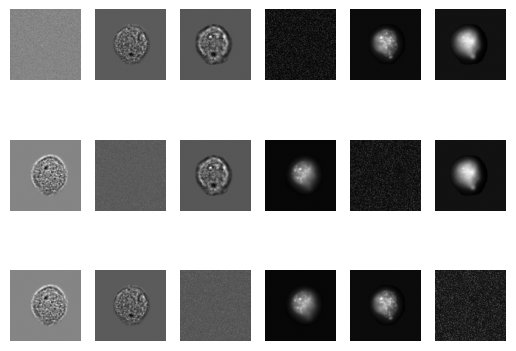

In [33]:
from tqdm import tqdm

def _permute_pixels(tensor, channel_idx):
    """Permute pixels in the specified channel of the input tensor."""
    permuted_tensor = tensor.clone()
    B, C, H, W = permuted_tensor.shape
    for b in range(B):
        flat_channel_bf = permuted_tensor[b, channel_idx].view(-1)
        flat_channel_405 = permuted_tensor[b, C // 2 + channel_idx].view(-1)
        permuted_indices_bf = torch.randperm(H * W)
        permuted_indices_405 = torch.randperm(H * W)
        flat_channel_bf = flat_channel_bf[permuted_indices_bf]
        flat_channel_405 = flat_channel_405[permuted_indices_405]
        permuted_tensor[b, channel_idx] = flat_channel_bf.view(H, W)
        permuted_tensor[b, C // 2 + channel_idx] = flat_channel_405.view(H, W)
    return permuted_tensor

def compute_pci(model, loader, channels, metric_fn):
    """Compute Permutation Channel Importance (PCI) for a specific channel."""
    model.eval()
    targets = []
    baseline_output_list = []
    permuted_output_list = [[] for _ in range(channels)]

    model.eval()
    with torch.no_grad():
        batch_idx=0
        for batch in tqdm(loader, "Computing PCI"):
            # if batch_idx > 0:
            #     break
            batch_idx += 1
            inputs, target = batch
            baseline_output: torch.Tensor = model(inputs.to(device))
            baseline_output_list.append(baseline_output.detach().cpu().numpy().squeeze())
            targets.append(target.detach().cpu().numpy().squeeze())
            for i in range(channels):
                permuted_inputs = _permute_pixels(inputs, i)
                if batch_idx == 1:
                    for j in range(channels*2):
                        import matplotlib.pyplot as plt
                        ax = plt.subplot(channels, channels * 2, i * channels * 2 + j + 1)
                        ax.imshow(permuted_inputs[0, j].cpu(), cmap='gray')
                        ax.axis('off')
                permuted_output: torch.Tensor = model(permuted_inputs.to(device))
                permuted_output_list[i].append(permuted_output.detach().cpu().numpy().squeeze())
    
    baseline_metric = metric_fn(baseline_output_list, targets)
    permuted_metrics = []
    for i in range(channels):
        permuted_metric = metric_fn(permuted_output_list[i], targets)
        permuted_metrics.append(permuted_metric)
        
    return baseline_metric, permuted_metrics

def mse(outputs, targets):
    # Concatenate all batch outputs along the first dimension
    outputs = np.concatenate(outputs, axis=0)
    targets = np.concatenate(targets, axis=0)

    outputs = (outputs % projector.perimeter) / projector.perimeter 

    return np.mean(projector.geodesic_distance(outputs, targets)**2)

baseline_metric, permuted_metrics = compute_pci(
    model,
    loader,
    channels=3,
    metric_fn=mse,
)
print(f"Baseline MSE: {baseline_metric}")
print(f"Permuted MSE Focal Plane 1: {permuted_metrics[0]}")
print(f"Permuted MSE Focal Plane 2: {permuted_metrics[1]}")
print(f"Permuted MSE Focal Plane 3: {permuted_metrics[2]}")

In [ ]:
### Filter ploting

In this section we investigate on the filters the model learned for the 1st layer

Sequential(
  (0): ConvBlock(
    (block): Sequential(
      (0): Conv2d(6, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
  )
  (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
)
Sequential(
  (0): ConvBlock(
    (block): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
  )
  (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
)
Sequential(
  (0): ConvBlock(
    (block): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
    )
  )
  (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=Fal

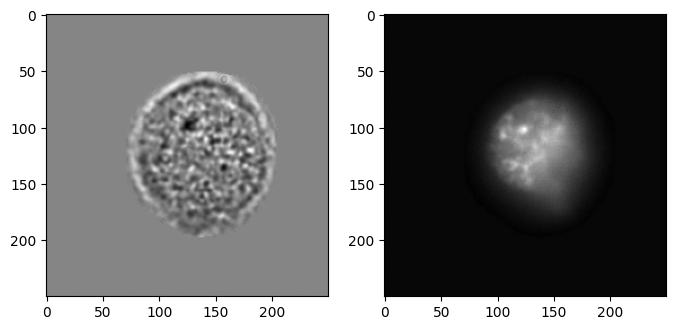

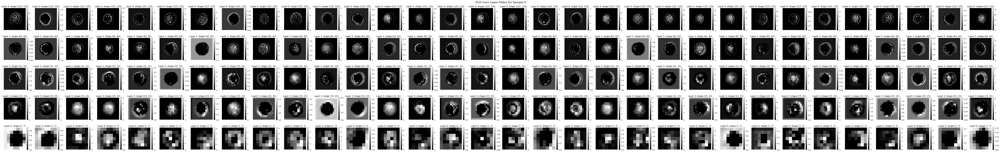

In [35]:
batch = next(iter(loader))
inputs, targets = batch
inputs = inputs.to(device)
inputs = inputs[0].view(1, *inputs[0].shape)
filters = []
with torch.no_grad():
    x = inputs
    for layer in model.conv_blocks:
        print(layer)
        x = layer(x)
        filters.append(x)


import matplotlib.pyplot as plt

# Select first sample from the batch
sample_idx = 0
fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(inputs[0][0].cpu(), cmap="gray")
axes[1].imshow(inputs[0][3].cpu(), cmap="gray")

# Create a grid to display all filters
columns = 32
fig, axes = plt.subplots(len(filters), columns, figsize=(columns * 2.5, len(filters) * 2.5))
fig.suptitle(f'First Conv Layer Filters for Sample {sample_idx}', fontsize=16)
for i, filter in enumerate(filters):
    for j in range(columns):
        ax = axes[i , j]
        filter_map = filter[0][j].detach().cpu().numpy()
        im = ax.imshow(filter_map, cmap='gray')
        ax.set_title(f'Layer {i}: shape {filter_map.shape}')
        ax.axis('off')
        plt.colorbar(im, ax=ax, fraction=0.046)
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

### High frequency vs low frequency features 

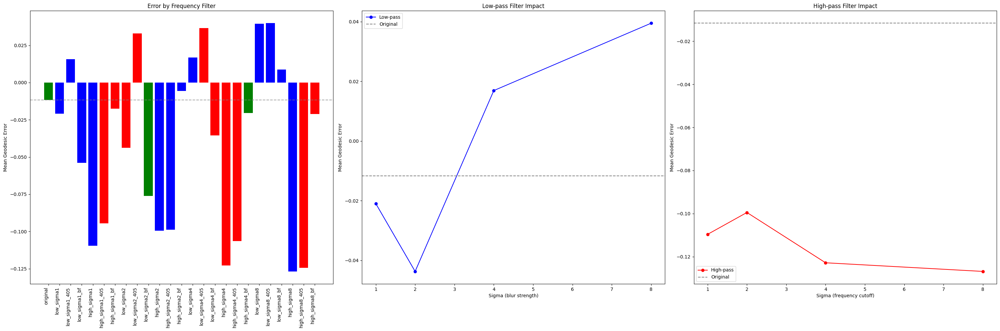

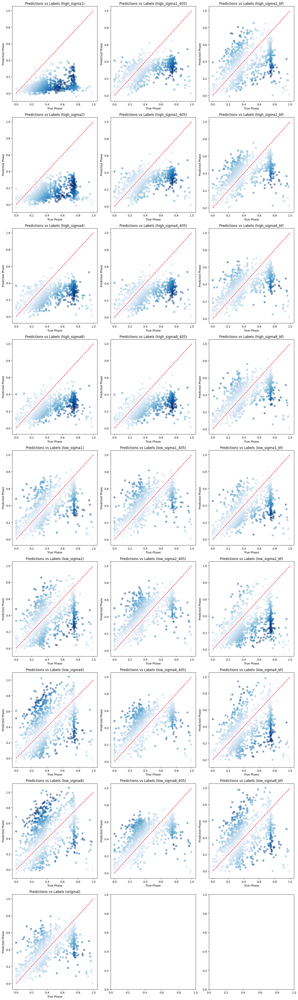

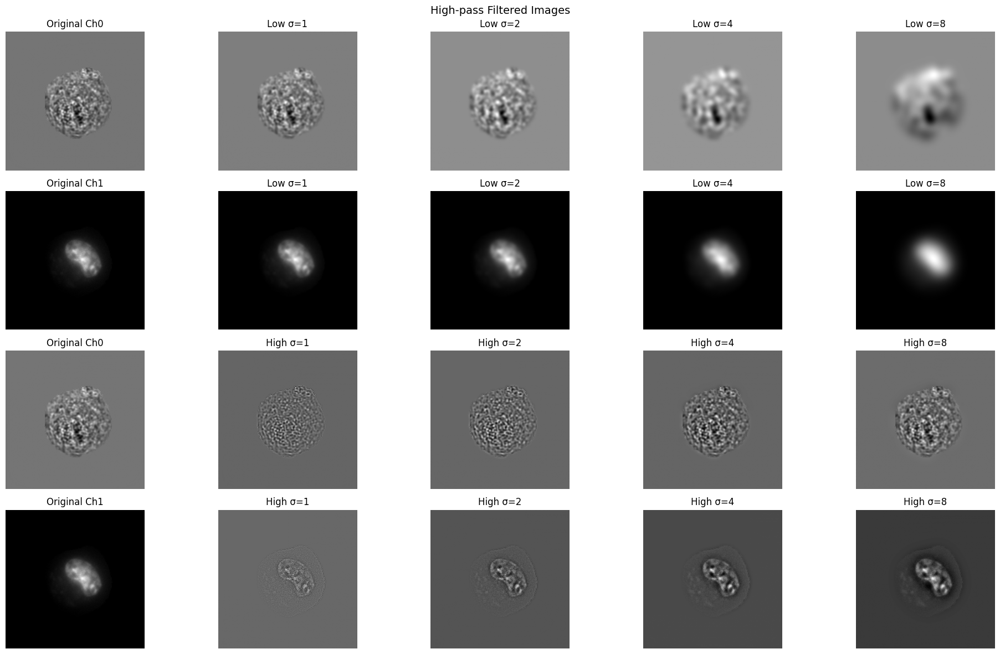


=== Frequency Analysis Summary ===
Original error: -0.0117

Low-pass (keeping low frequencies):
  σ=1: -0.0210 (Δ=-0.0093)
  σ=2: -0.0437 (Δ=-0.0321)
  σ=4: 0.0169 (Δ=+0.0286)
  σ=8: 0.0395 (Δ=+0.0512)

High-pass (keeping high frequencies):
  σ=1: -0.1096 (Δ=-0.0980)
  σ=2: -0.0995 (Δ=-0.0878)
  σ=4: -0.1228 (Δ=-0.1112)
  σ=8: -0.1268 (Δ=-0.1152)


In [45]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage
from tqdm import tqdm

def apply_frequency_filter(images, filter_type='low', sigma=2.0):
    """
    Apply low-pass or high-pass filter to images.
    
    Args:
        images: Tensor of shape [B, C, H, W] or [B, H, W]
        filter_type: 'low' for low-pass, 'high' for high-pass
        sigma: Gaussian blur sigma (higher = more blur / lower frequencies)
    
    Returns:
        Filtered images tensor
    """
    images_np = images.cpu().numpy()
    filtered = np.zeros_like(images_np)
    
    if len(images_np.shape) == 3:  # [B, H, W]
        for b in range(images_np.shape[0]):
            if filter_type == 'low':
                filtered[b] = ndimage.gaussian_filter(images_np[b], sigma=sigma)
            elif filter_type == 'high':
                low_pass = ndimage.gaussian_filter(images_np[b], sigma=sigma)
                filtered[b] = images_np[b] - low_pass
    else:  # [B, C, H, W]
        for b in range(images_np.shape[0]):
            for c in range(images_np.shape[1]):
                if filter_type == 'low':
                    filtered[b, c] = ndimage.gaussian_filter(images_np[b, c], sigma=sigma)
                elif filter_type == 'high':
                    low_pass = ndimage.gaussian_filter(images_np[b, c], sigma=sigma)
                    filtered[b, c] = images_np[b, c] - low_pass
    
    return torch.from_numpy(filtered).float()

def evaluate_frequency_impact(model, loader, sigmas=[1, 2, 4, 8], max_batches=None):
    """Evaluate model performance on low/high pass filtered images."""
    model.eval()
    device = next(model.parameters()).device
    
    results = {
        'original': {'predictions': [], 'labels': []},
    }
    for sigma in sigmas:
        results[f'low_sigma{sigma}'] = {'predictions': [], 'labels': []}
        results[f'low_sigma{sigma}_405'] = {'predictions': [], 'labels': []}
        results[f'low_sigma{sigma}_bf'] = {'predictions': [], 'labels': []}
        results[f'high_sigma{sigma}'] = {'predictions': [], 'labels': []}
        results[f'high_sigma{sigma}_405'] = {'predictions': [], 'labels': []}
        results[f'high_sigma{sigma}_bf'] = {'predictions': [], 'labels': []}
    
    with torch.no_grad():
        for batch_idx, batch in enumerate(tqdm(loader, desc="Evaluating frequency impact")):
            if max_batches and batch_idx >= max_batches:
                break
            
            images, labels = batch
            features = None
            if isinstance(images, (list, tuple)):
                images, features = images
                features = features.to(device)
            
            # Original predictions - move images to device
            if features is not None:
                pred = model(images.to(device), features)
            else:
                pred = model(images.to(device))
            results['original']['predictions'].append(pred.cpu().numpy())
            results['original']['labels'].append(labels.numpy())
            
            # Filtered predictions
            for sigma in sigmas:
                # Low-pass (all channels)
                low_filtered = apply_frequency_filter(images, 'low', sigma).to(device)
                
                # Low-pass BF only (channel 0)
                low_filtered_bf_ch = apply_frequency_filter(images[:, 0, :, :], 'low', sigma)
                low_filtered_bf = torch.cat([low_filtered_bf_ch.unsqueeze(1), images[:, 1:, :, :]], dim=1).to(device)
                
                # Low-pass 405 only (channel 1)
                low_filtered_405_ch = apply_frequency_filter(images[:, 1, :, :], 'low', sigma)
                low_filtered_405 = torch.cat([images[:, 0:1, :, :], low_filtered_405_ch.unsqueeze(1), images[:, 2:, :, :]], dim=1).to(device)
                
                if features is not None:
                    pred_low = model(low_filtered, features)
                    pred_low_405 = model(low_filtered_405, features)
                    pred_low_bf = model(low_filtered_bf, features)
                else:
                    pred_low = model(low_filtered)
                    pred_low_405 = model(low_filtered_405)
                    pred_low_bf = model(low_filtered_bf)
                    
                results[f'low_sigma{sigma}']['predictions'].append(pred_low.cpu().numpy())
                results[f'low_sigma{sigma}']['labels'].append(labels.numpy())
                results[f'low_sigma{sigma}_405']['predictions'].append(pred_low_405.cpu().numpy())
                results[f'low_sigma{sigma}_405']['labels'].append(labels.numpy())
                results[f'low_sigma{sigma}_bf']['predictions'].append(pred_low_bf.cpu().numpy())
                results[f'low_sigma{sigma}_bf']['labels'].append(labels.numpy())
                
                # High-pass
                high_filtered = apply_frequency_filter(images, 'high', sigma).to(device)
                
                high_filtered_bf_ch = apply_frequency_filter(images[:, 0, :, :], 'high', sigma)
                high_filtered_bf = torch.cat([high_filtered_bf_ch.unsqueeze(1), images[:, 1:, :, :]], dim=1).to(device)
                high_filtered_405_ch = apply_frequency_filter(images[:, 1, :, :], 'high', sigma)
                high_filtered_405 = torch.cat([images[:, 0:1, :, :], high_filtered_405_ch.unsqueeze(1), images[:, 2:, :, :]], dim=1).to(device)
                high_filtered_bf_ch = apply_frequency_filter(images[:, 0, :, :], 'high', sigma)
                high_filtered_bf = torch.cat([high_filtered_bf_ch.unsqueeze(1), images[:, 1:, :, :]], dim=1).to(device)
                
                if features is not None:
                    pred_high = model(high_filtered, features)
                    high_filtered_405 = model(high_filtered_405, features)
                    high_filtered_bf = model(high_filtered_bf, features)
                else:
                    pred_high = model(high_filtered)
                    high_filtered_405 = model(high_filtered_405)
                    high_filtered_bf = model(high_filtered_bf)
                results[f'high_sigma{sigma}']['predictions'].append(pred_high.cpu().numpy())
                results[f'high_sigma{sigma}']['labels'].append(labels.numpy())
                results[f'high_sigma{sigma}_405']['predictions'].append(high_filtered_405.cpu().numpy())
                results[f'high_sigma{sigma}_405']['labels'].append(labels.numpy())
                results[f'high_sigma{sigma}_bf']['predictions'].append(high_filtered_bf.cpu().numpy())
                results[f'high_sigma{sigma}_bf']['labels'].append(labels.numpy())
    
    # Concatenate results
    for key in results:
        results[key]['predictions'] = np.concatenate(results[key]['predictions'], axis=0).squeeze()
        results[key]['labels'] = np.concatenate(results[key]['labels'], axis=0).squeeze()
    
    return results

# Run frequency analysis
sigmas = [1, 2, 4, 8]
# freq_results = evaluate_frequency_impact(model, loader, sigmas=sigmas, max_batches=20)

# Calculate errors for each condition
errors = {}
for key, data in freq_results.items():
    preds = data['predictions']
    labels = data['labels']
    if preds.max() > 1:
        preds = preds % 1.0
    errors[key] = np.mean(projector.geodesic_distance(preds, labels))

# Plot results
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# Bar plot of errors
conditions = list(errors.keys())
error_values = [errors[k] for k in conditions]
colors = ['green'] + ['blue']*len(sigmas) + ['red']*len(sigmas)
axes[0].bar(range(len(conditions)), error_values, color=colors)
axes[0].set_xticks(range(len(conditions)))
axes[0].set_xticklabels(conditions, rotation=90, ha='right')
axes[0].set_ylabel('Mean Geodesic Error')
axes[0].set_title('Error by Frequency Filter')
axes[0].axhline(y=errors['original'], color='gray', linestyle='--', alpha=0.7)

# Low-pass vs sigma
low_errors = [errors[f'low_sigma{s}'] for s in sigmas]
axes[1].plot(sigmas, low_errors, 'b-o', label='Low-pass')
axes[1].axhline(y=errors['original'], color='gray', linestyle='--', label='Original')
axes[1].set_xlabel('Sigma (blur strength)')
axes[1].set_ylabel('Mean Geodesic Error')
axes[1].set_title('Low-pass Filter Impact')
axes[1].legend()

# High-pass vs sigma
high_errors = [errors[f'high_sigma{s}'] for s in sigmas]
axes[2].plot(sigmas, high_errors, 'r-o', label='High-pass')
axes[2].axhline(y=errors['original'], color='gray', linestyle='--', label='Original')
axes[2].set_xlabel('Sigma (frequency cutoff)')
axes[2].set_ylabel('Mean Geodesic Error')
axes[2].set_title('High-pass Filter Impact')
axes[2].legend()

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(9, 3, figsize=(3*5, 10*5))
for i, key in enumerate(sorted(freq_results.keys())):
    preds = freq_results[key]['predictions']
    labels = freq_results[key]['labels']
    ax = axes[i //3, i % 3]
    ax.scatter(labels, preds, alpha=0.5, c=np.abs(projector.geodesic_distance(preds, labels)), cmap='Blues')
    ax.set_title(f'Predictions vs Labels ({key})')
    ax.set_xlabel('True Phase')
    ax.set_ylabel('Predicted Phase')
    ax.plot([0, 1], [0, 1], 'r--')
plt.tight_layout()
plt.show()

# Visualize filtered images
batch = next(iter(loader))
images, _ = batch
if isinstance(images, (list, tuple)):
    images, _ = images
sample_img = images[0:1]

fig, axes = plt.subplots(4, len(sigmas)+1, figsize=(4*(len(sigmas)+1), 12))
for c in range(min(2, sample_img.shape[1])):
    axes[c, 0].imshow(sample_img[0, c].numpy(), cmap='gray')
    axes[c, 0].set_title(f'Original Ch{c}')
    axes[c, 0].axis('off')
    
    for i, sigma in enumerate(sigmas):
        low = apply_frequency_filter(sample_img, 'low', sigma)
        axes[c, i+1].imshow(low[0, c].numpy(), cmap='gray')
        axes[c, i+1].set_title(f'Low σ={sigma}')
        axes[c, i+1].axis('off')
for c in range(min(2, sample_img.shape[1])):
    axes[c+2, 0].imshow(sample_img[0, c].numpy(), cmap='gray')
    axes[c+2, 0].set_title(f'Original Ch{c}')
    axes[c+2, 0].axis('off')
    
    for i, sigma in enumerate(sigmas):
        low = apply_frequency_filter(sample_img, 'high', sigma)
        axes[c+2, i+1].imshow(low[0, c].numpy(), cmap='gray')
        axes[c+2, i+1].set_title(f'High σ={sigma}')
        axes[c+2, i+1].axis('off')
plt.suptitle('High-pass Filtered Images', fontsize=14)
plt.tight_layout()
plt.show()

print("\n=== Frequency Analysis Summary ===")
print(f"Original error: {errors['original']:.4f}")
print(f"\nLow-pass (keeping low frequencies):")
for s in sigmas:
    print(f"  σ={s}: {errors[f'low_sigma{s}']:.4f} (Δ={errors[f'low_sigma{s}']-errors['original']:+.4f})")
print(f"\nHigh-pass (keeping high frequencies):")
for s in sigmas:
    print(f"  σ={s}: {errors[f'high_sigma{s}']:.4f} (Δ={errors[f'high_sigma{s}']-errors['original']:+.4f})")

Image SHAP values shape: (12, 2, 250, 250, 1)
Feature SHAP values shape: (12, 27, 1)

Shapes before processing:
shap_values_for_plot shape: (12, 2, 250, 250, 1)
test_input_for_plot shape: torch.Size([12, 2, 250, 250])
Removing extra trailing dimension from SHAP values
New shape: (12, 2, 250, 250)

Shapes after transpose:
SHAP numpy shape: (12, 250, 250, 2)
Image numpy shape: (12, 250, 250, 2)
Feature SHAP shape for sample 0: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


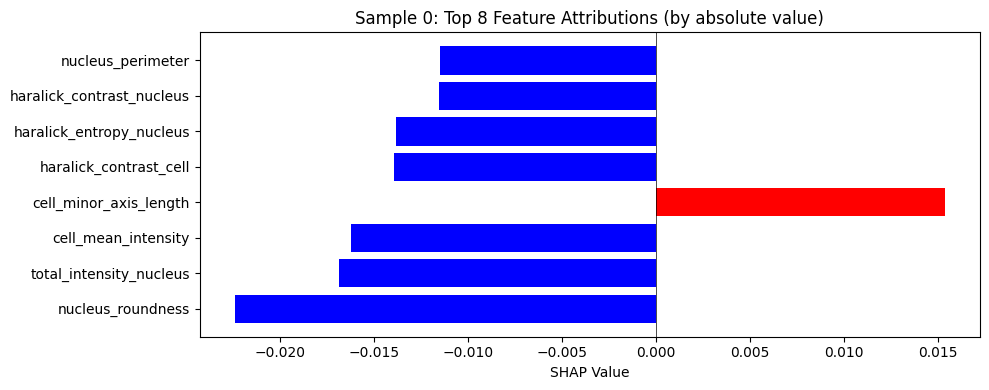

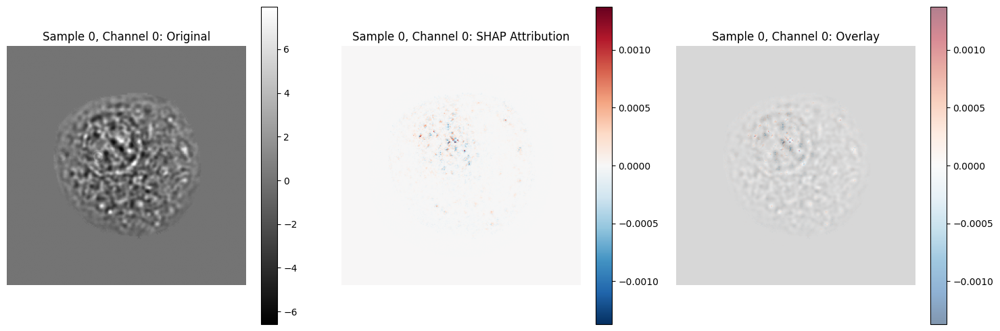

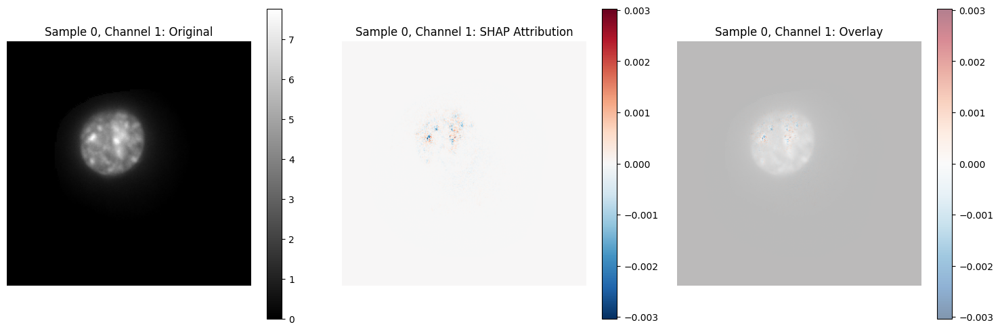

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


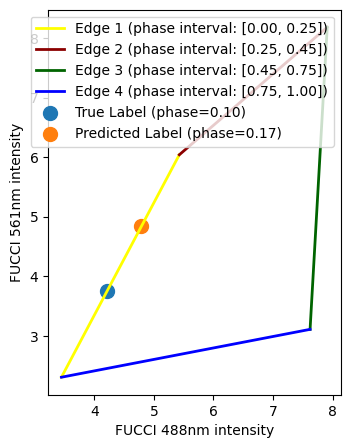

<Figure size 640x480 with 0 Axes>

Feature SHAP shape for sample 1: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


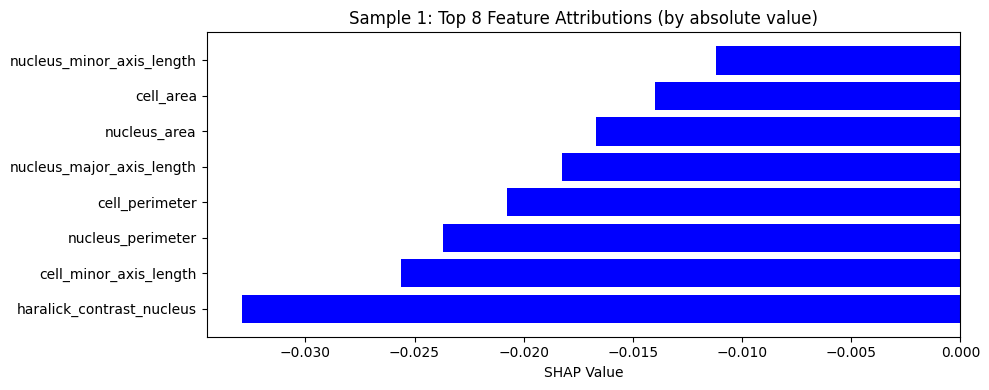

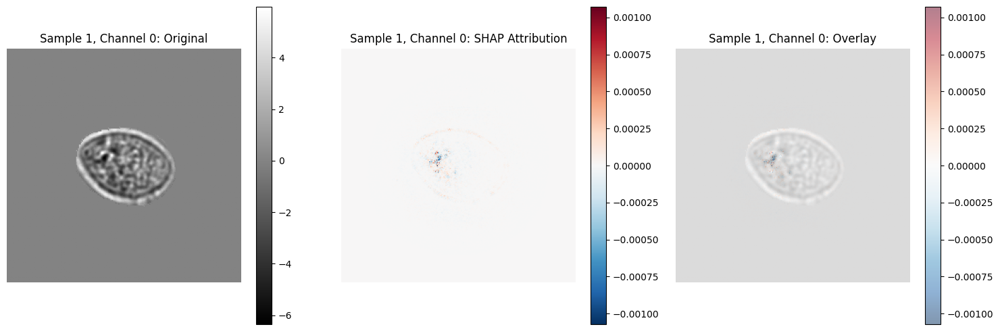

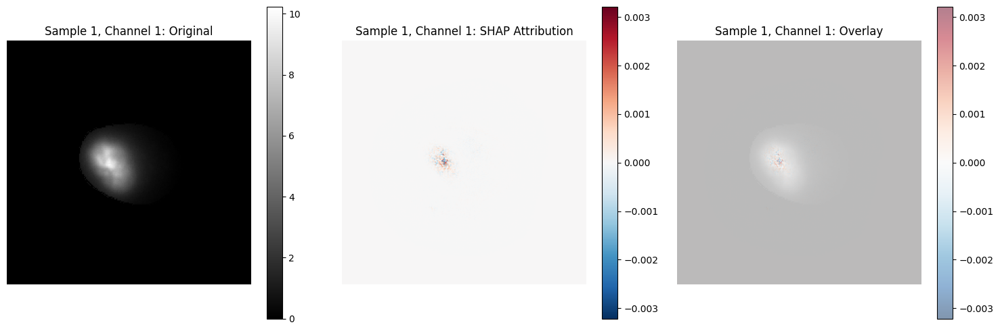

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


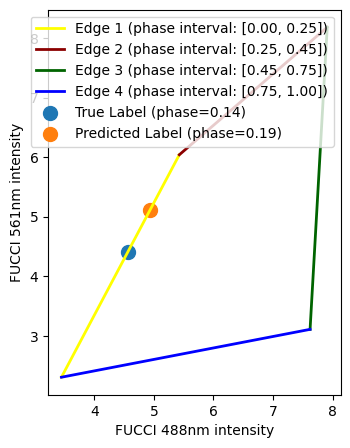

<Figure size 640x480 with 0 Axes>

Feature SHAP shape for sample 2: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


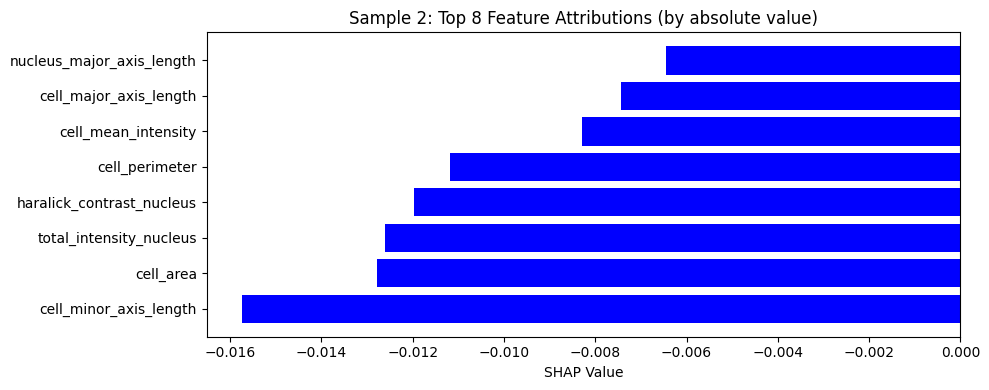

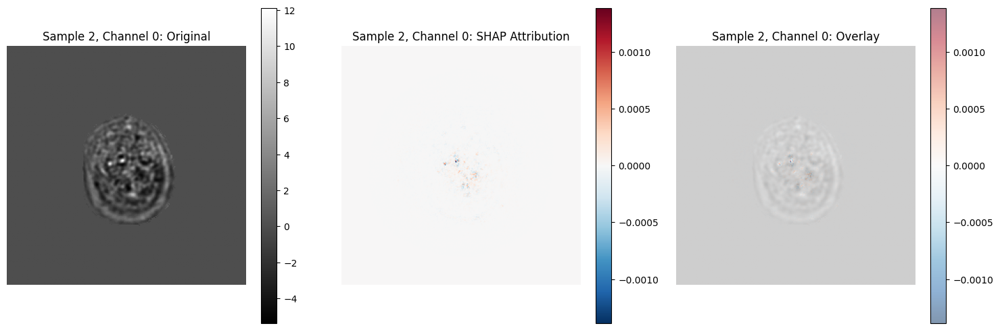

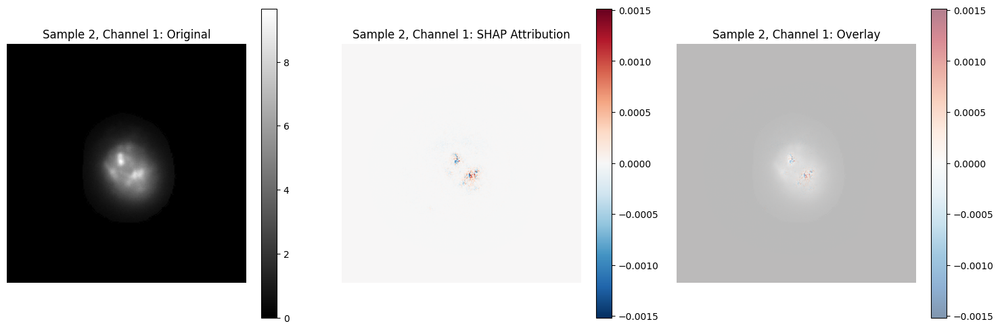

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


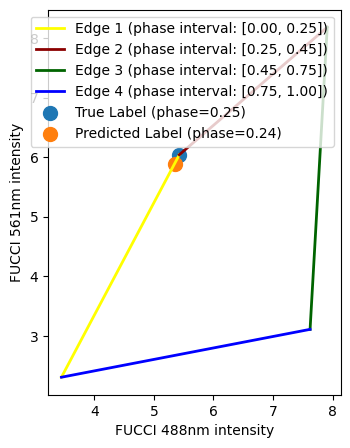

<Figure size 640x480 with 0 Axes>

Feature SHAP shape for sample 3: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


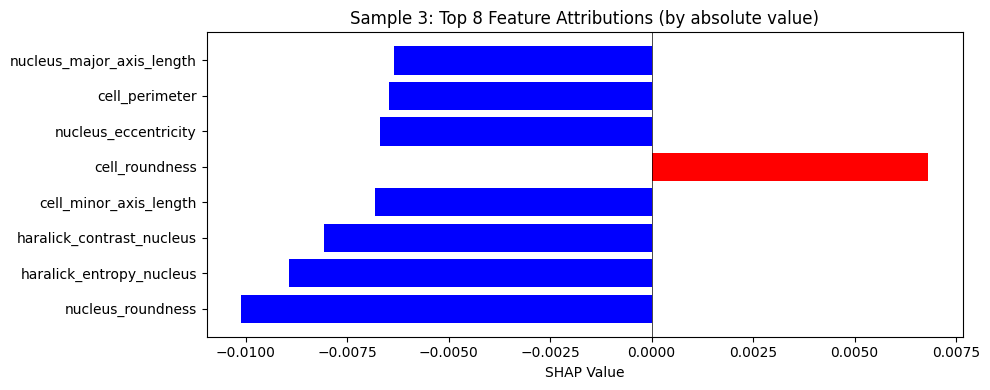

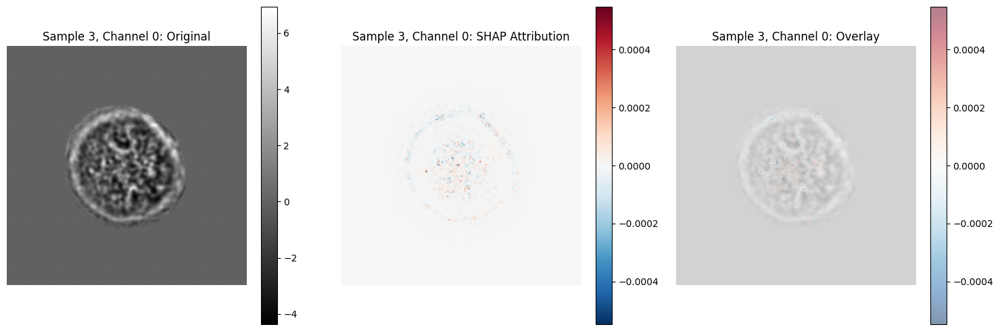

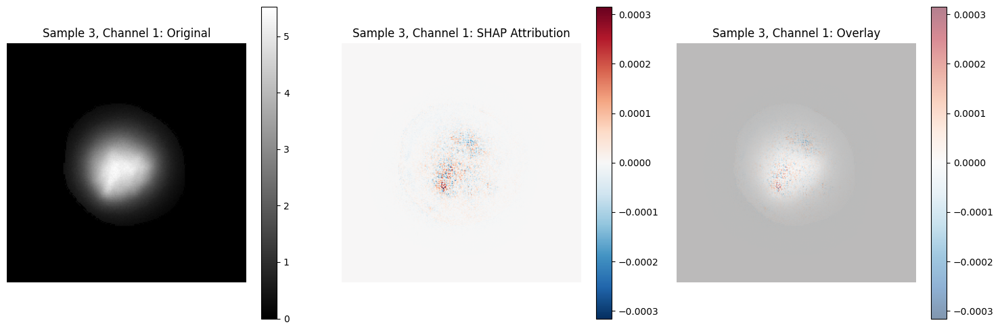

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


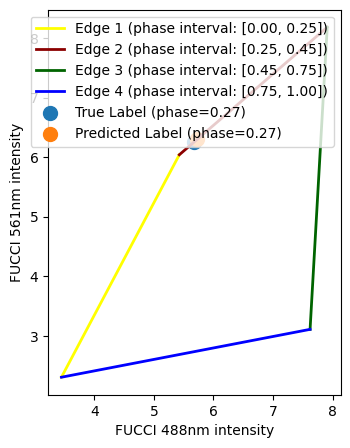

<Figure size 640x480 with 0 Axes>

Feature SHAP shape for sample 4: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


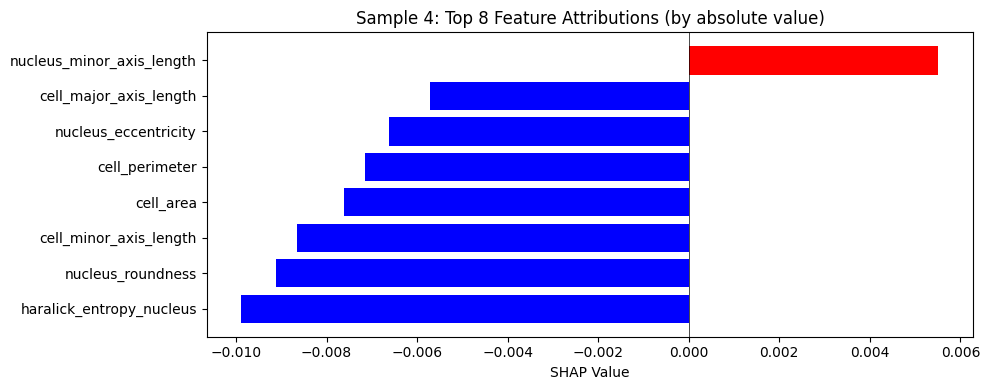

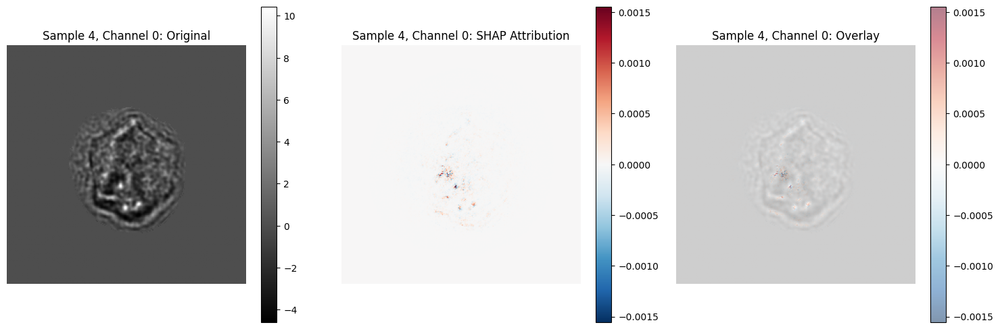

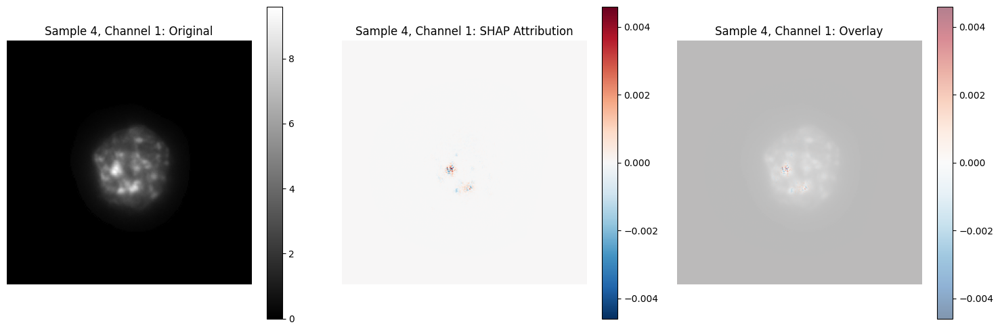

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


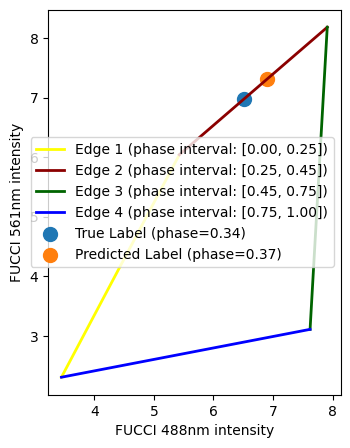

<Figure size 640x480 with 0 Axes>

Feature SHAP shape for sample 5: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


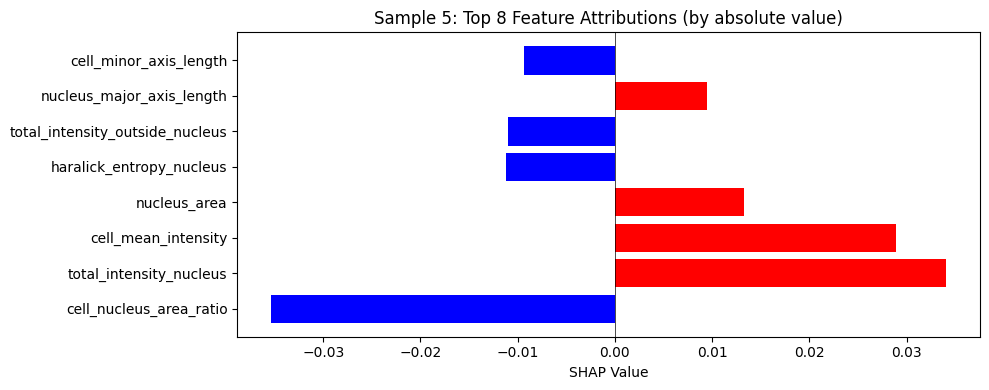

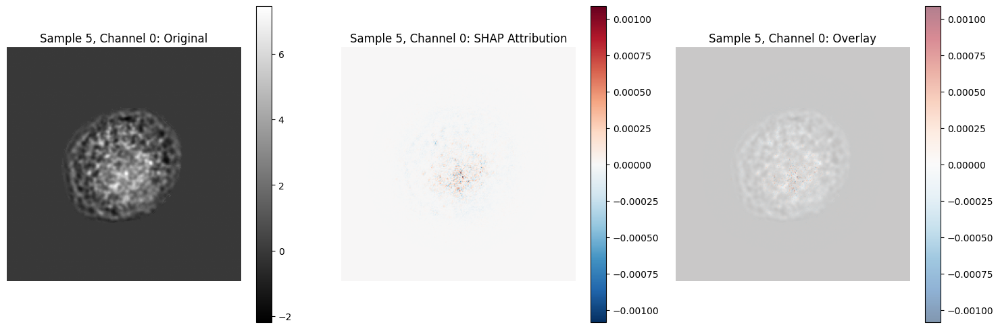

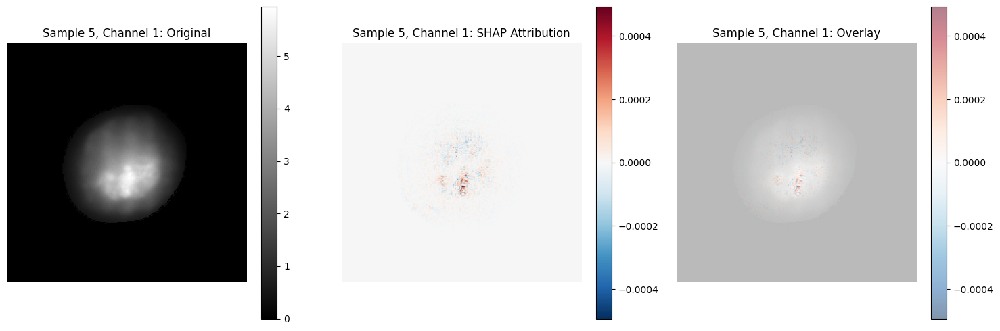

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


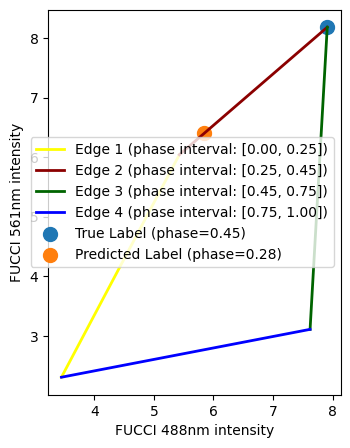

<Figure size 640x480 with 0 Axes>

Feature SHAP shape for sample 6: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


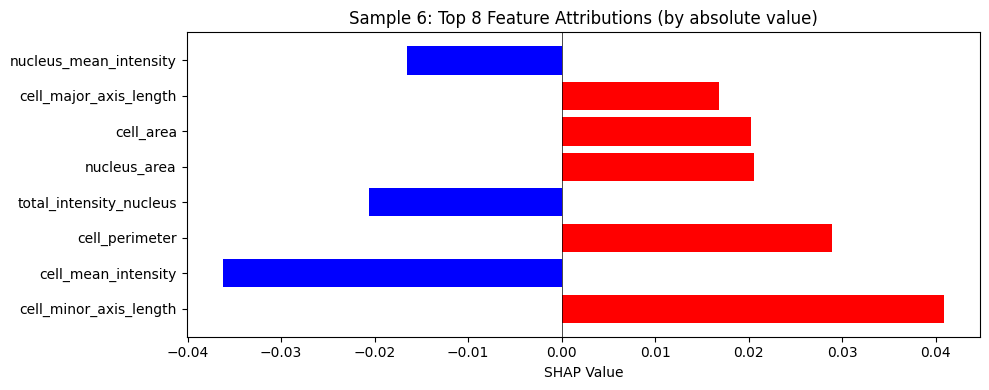

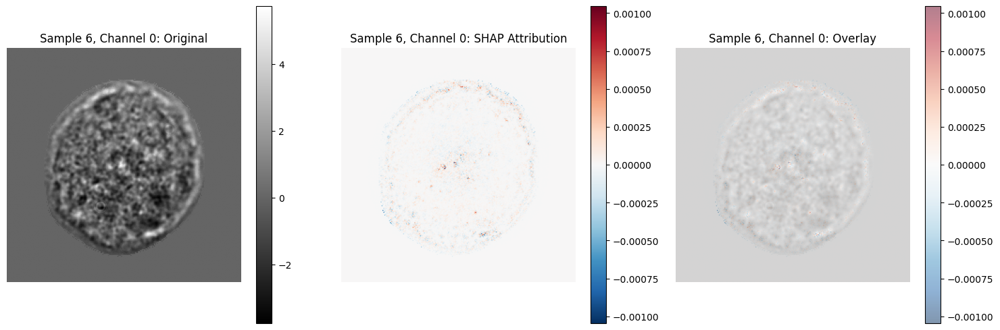

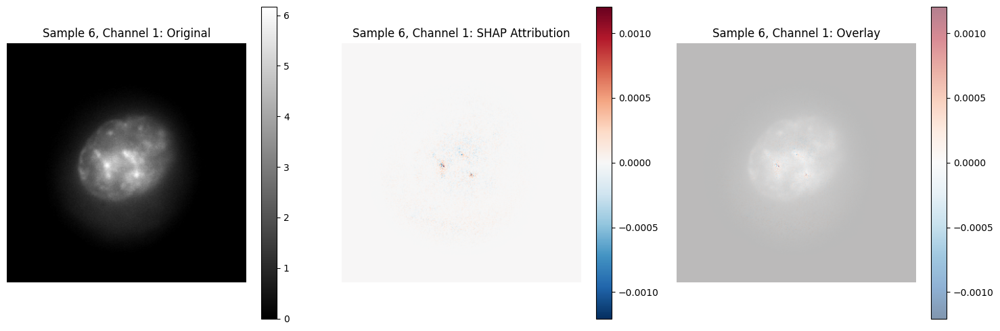

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


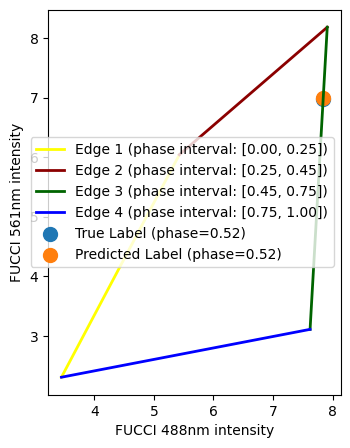

<Figure size 640x480 with 0 Axes>

Feature SHAP shape for sample 7: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


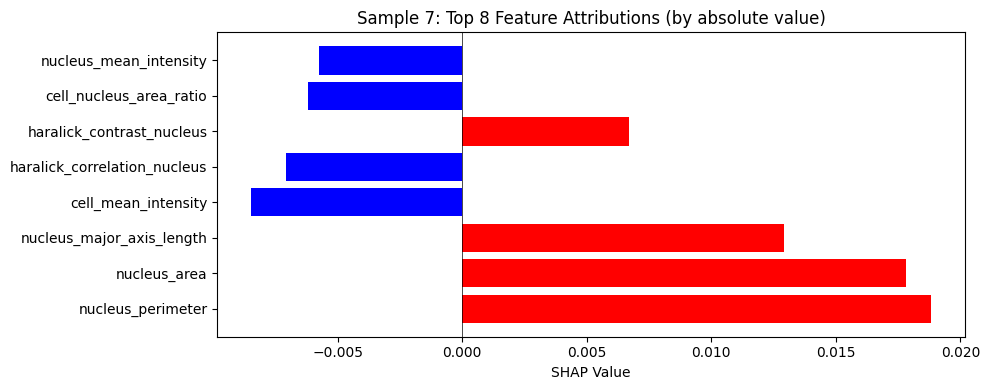

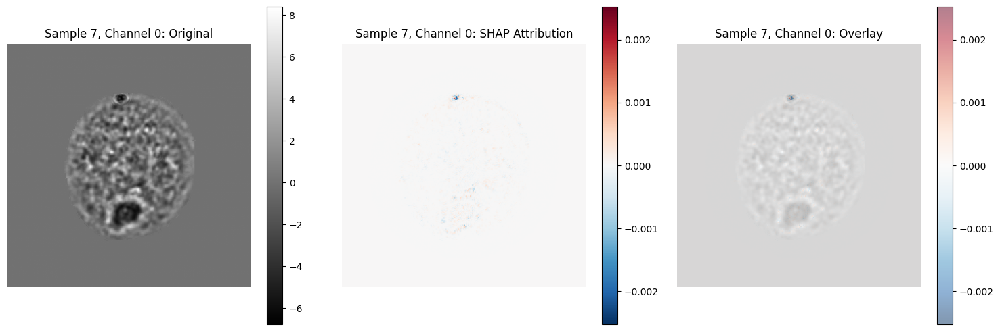

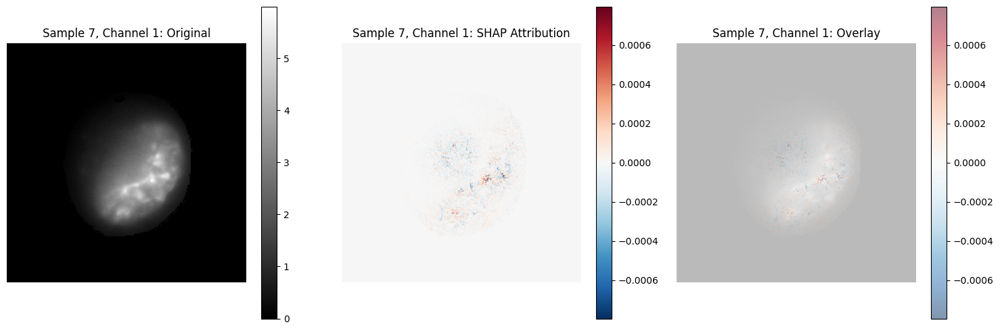

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


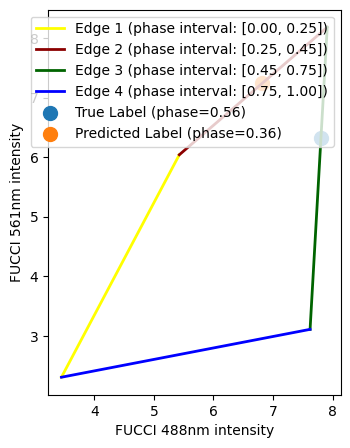

<Figure size 640x480 with 0 Axes>

Feature SHAP shape for sample 8: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


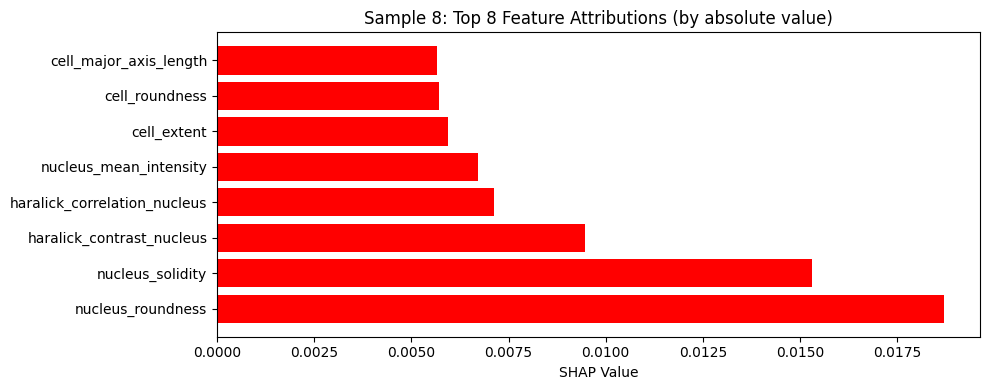

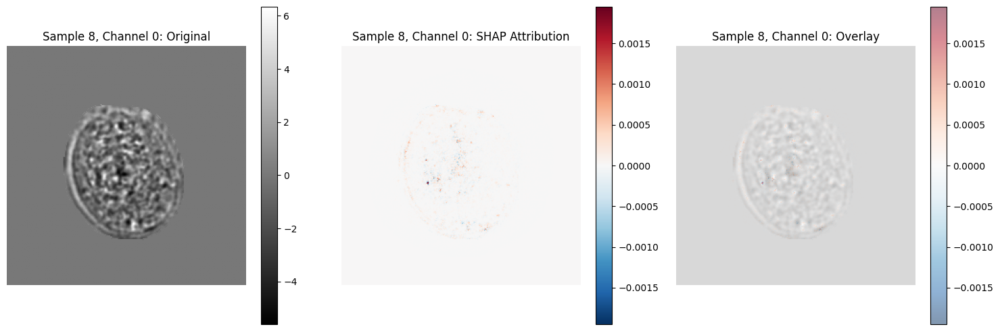

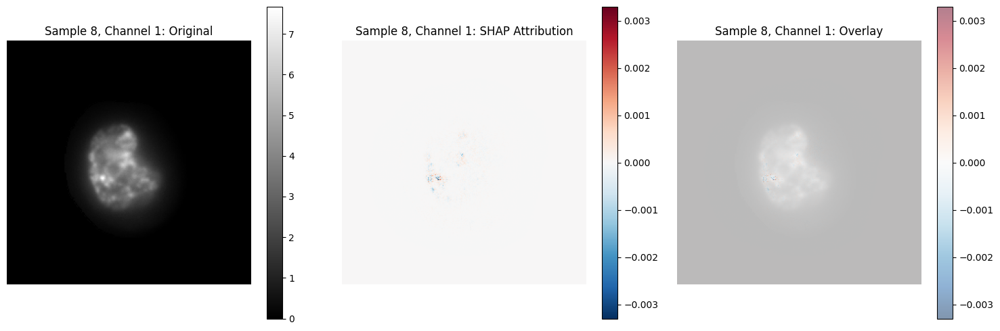

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


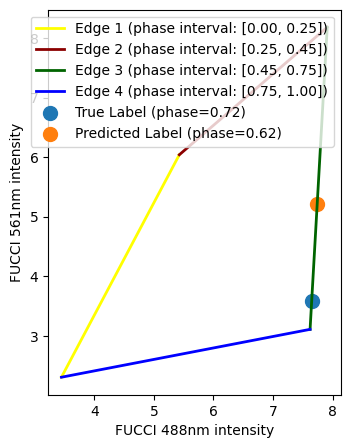

<Figure size 640x480 with 0 Axes>

Feature SHAP shape for sample 9: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


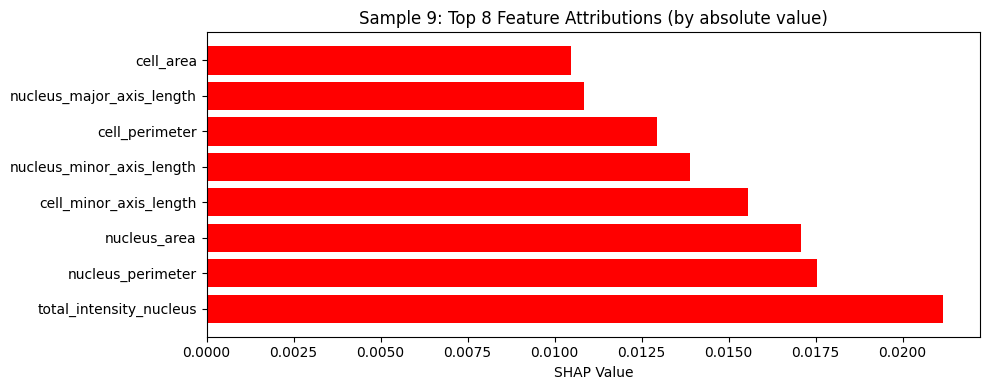

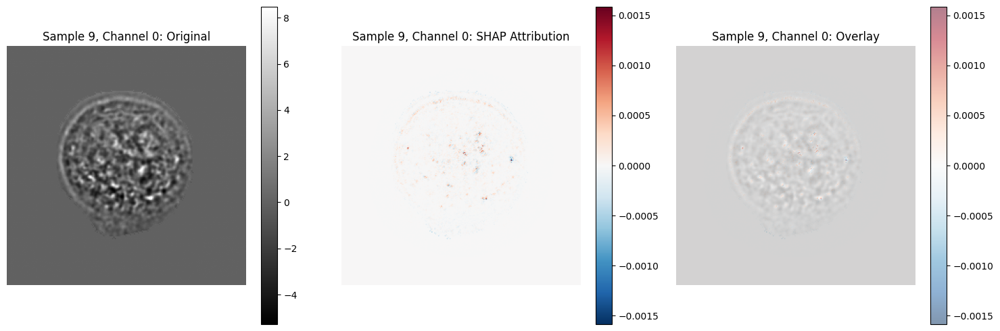

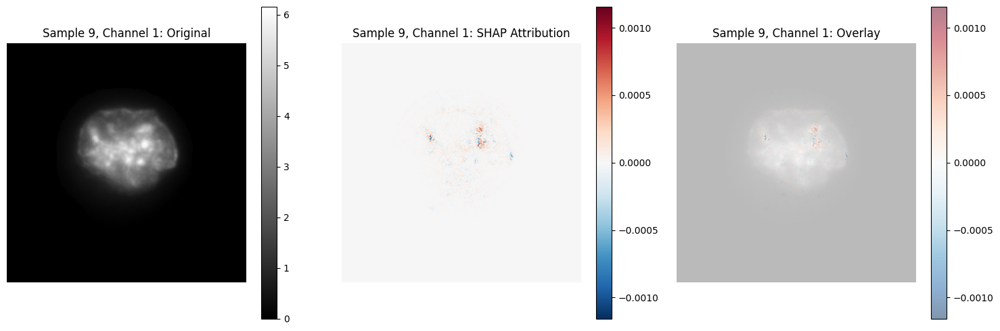

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


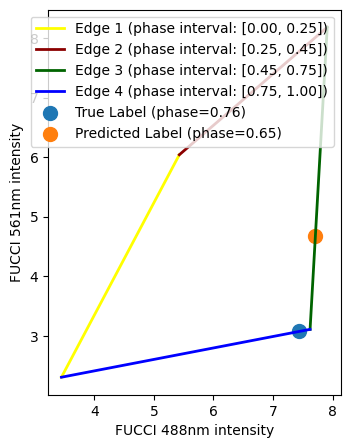

<Figure size 640x480 with 0 Axes>

Feature SHAP shape for sample 10: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


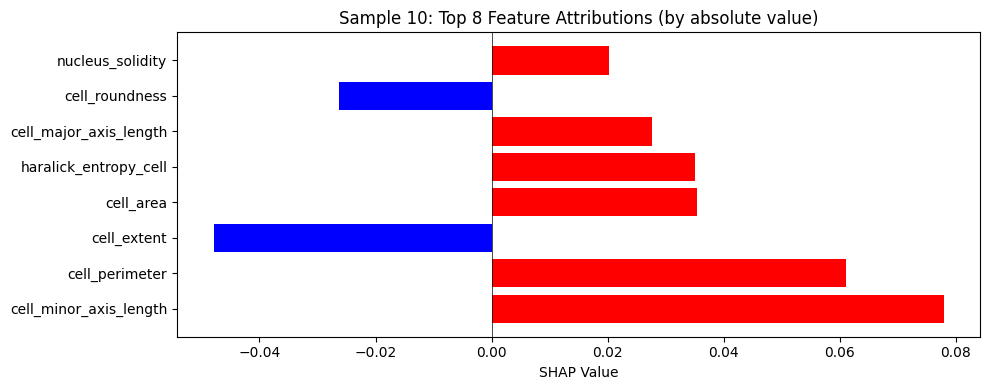

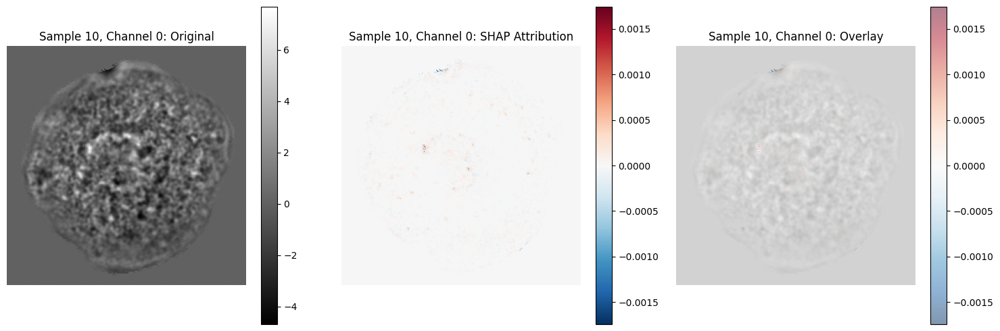

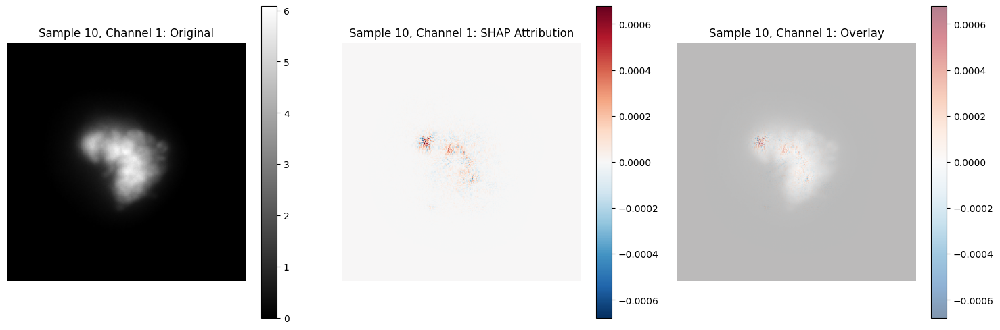

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


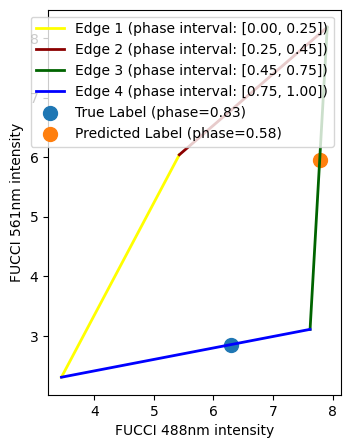

<Figure size 640x480 with 0 Axes>

Feature SHAP shape for sample 11: (27, 1)
✓ Loaded cache: /myhome/iris/data/features/features_fa560b66b304.parquet


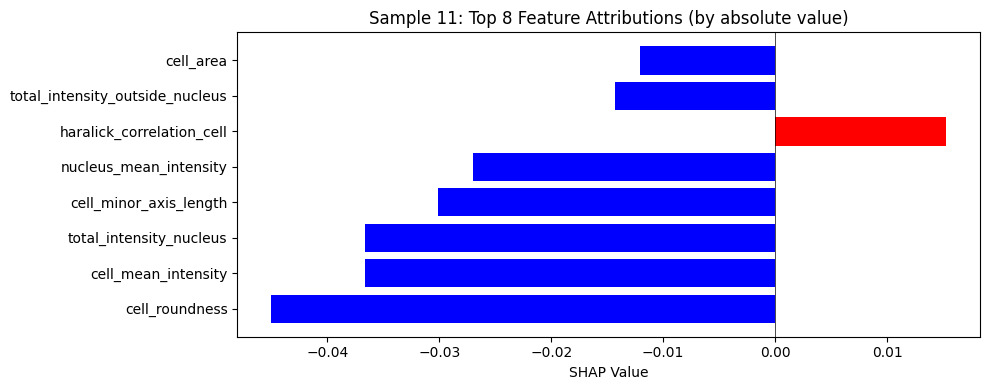

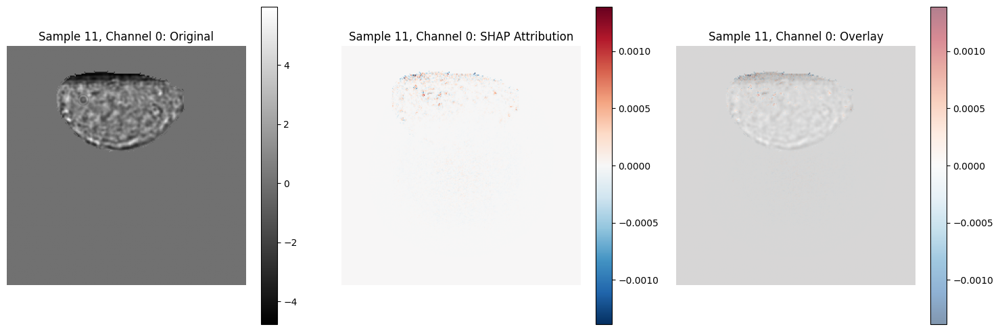

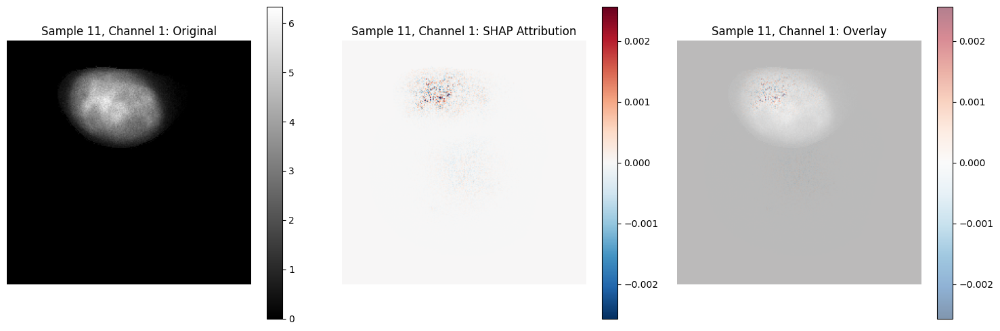

/tmp/ipykernel_17210/4222371778.py:198: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  projector.plot(ax_label, named_points=[("True Label", float(true_label)),
/tmp/ipykernel_17210/4222371778.py:199: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  ("Predicted Label", float(pred_label))])


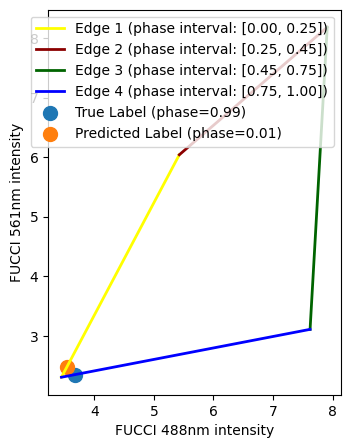

<Figure size 640x480 with 0 Axes>

In [3]:
import shap
import torch
import numpy as np
import matplotlib.pyplot as plt
from src.evaluation.model_interpretation import _select_best_and_worst_examples_per_phase_bin, _compute_integrated_gradients, _clear_cuda_memory

shap_model = model
iterator = iter(loader)
test_features = []
test_images = []
test_labels = []
predictions = []
for i in range(1):
    images_batch, labels_batch = next(iterator)
    if isinstance(images_batch, (tuple, list)):
        images_batch, features_batch = images_batch
        test_features.append(features_batch)
    images_batch = images_batch.to(device)
    test_images.append(images_batch)
    test_labels.append(labels_batch)
    with torch.no_grad():
        if len(test_features) != 0:
            predictions.append(model(images_batch, features_batch.to(device)).cpu())
        else:
            predictions.append(model(images_batch).cpu())
    
test_images = torch.cat(test_images, 0)
test_labels = torch.cat(test_labels, 0)
if len(test_features) != 0:
    test_features = torch.cat(test_features, 0)
predictions = torch.cat(predictions, 0)


best_pred_indices, _, _ , = _select_best_and_worst_examples_per_phase_bin(predictions,test_labels, projector=projector, num_bins = 15,)
best_pred_indices = np.concatenate(best_pred_indices)
test_input = test_images[best_pred_indices[1:]] if len(test_features) == 0 else (test_images[best_pred_indices[1:]], test_features[best_pred_indices[1:]])  # Shape: [1, C, H, W]
test_labels = test_labels[best_pred_indices[1:]]
predictions = predictions[best_pred_indices[1:]]


baseline = torch.zeros_like(test_input[0]) if len(test_features) == 0 else (torch.zeros_like(test_input[0]), torch.zeros_like(test_input[1]))
ig_attribution = []
try:
    for i in range(test_labels.shape[0]):
        ig_attribution.append(_compute_integrated_gradients(shap_model, test_input[i:i+1], baselines=baseline[i:i+1]))
    ig_attribution = torch.cat(ig_attribution, 0).detach().cpu().numpy()
except:
    pass



images = []
features = []
for i in range(1):
    images_batch, _ = next(iterator)
    if isinstance(images_batch, (tuple, list)):
        images_batch, features_batch = images_batch
        features.append(features_batch)
    images.append(images_batch)
    
if len(features) != 0:
    features = torch.cat(features, 0)[:60].to(device)
    background = (torch.cat(images, 0)[:60].to(device), features)
else:
    background = torch.cat(images, 0)[:60].to(device)  # Shape: [64, C, H, W]



explainer = shap.DeepExplainer(shap_model, list(background))
test_input_list = [test_input[0].to(device), test_input[1].to(device)]

# Run the explanation
if isinstance(test_input, tuple):
    # For tuple inputs (images, features), SHAP expects a list
    shap_values = explainer.shap_values(test_input_list)
    
    # shap_values will be a list with two elements:
    # shap_values[0] = attributions for images [B, C, H, W]
    # shap_values[1] = attributions for features [B, F]
    
    image_shap = shap_values[0]
    feature_shap = shap_values[1]
    
    print(f"Image SHAP values shape: {image_shap.shape}")
    print(f"Feature SHAP values shape: {feature_shap.shape}")
    
    # Use image_shap for visualization
    shap_values_for_plot = image_shap
    test_input_for_plot = test_input[0]
else:
    shap_values = explainer.shap_values(test_input.to(device))
    if isinstance(shap_values, list):
        shap_values = shap_values[0]
    shap_values_for_plot = shap_values
    test_input_for_plot = test_input
    image_shap = shap_values_for_plot
    feature_shap = None

print(f"\nShapes before processing:")
print(f"shap_values_for_plot shape: {shap_values_for_plot.shape}")
print(f"test_input_for_plot shape: {test_input_for_plot.shape}")

# Remove extra dimension if present (SHAP sometimes adds a trailing dimension)
if len(shap_values_for_plot.shape) == 5 and shap_values_for_plot.shape[-1] == 1:
    print("Removing extra trailing dimension from SHAP values")
    shap_values_for_plot = shap_values_for_plot.squeeze(-1)
    print(f"New shape: {shap_values_for_plot.shape}")


shap_numpy = np.transpose(shap_values_for_plot, (0, 2, 3, 1))
image_numpy = np.transpose(test_input_for_plot.cpu().detach().numpy(), (0, 2, 3, 1))


print(f"\nShapes after transpose:")
print(f"SHAP numpy shape: {shap_numpy.shape}")
print(f"Image numpy shape: {image_numpy.shape}")

for i in range(test_labels.shape[0]):
    # SHAP plots for feature attributions (if available)
    if feature_shap is not None:
        print(f"Feature SHAP shape for sample {i}: {feature_shap[i].shape}")
        
        # Ensure feature_shap[i] is 1D
        feat_values = feature_shap[i]
        if len(feat_values.shape) > 1:
            feat_values = feat_values.flatten()
        
        # Get top 8 features by absolute value
        abs_values = np.abs(feat_values)
        top_indices = np.argsort(abs_values)[-8:][::-1]  # Get top 8 indices, reversed for descending order
        
        feature_names = loader.dataset.dataset.feature_dataset.get_dataset_df().drop(columns=["phase"]).columns.tolist()
        top_names = [feature_names[j] for j in top_indices]
        top_values = feat_values[top_indices]
        
        plt.figure(figsize=(10, 4))
        colors = ['blue' if v < 0 else 'red' for v in top_values]
        plt.barh(top_names, top_values, color=colors)
        plt.xlabel('SHAP Value')
        plt.title(f'Sample {i}: Top 8 Feature Attributions (by absolute value)')
        plt.axvline(x=0, color='black', linestyle='-', linewidth=0.5)
        plt.tight_layout()
        plt.show()
    
    # Plot for each image channel
    for ch in range(image_numpy.shape[-1]):
        # Get channel data
        channel_shap = shap_numpy[i, :, :, ch]  # [H, W]
        channel_image = image_numpy[i, :, :, ch]  # [H, W]
        
        # Create custom visualization
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        # Original image
        im0 = axes[0].imshow(channel_image, cmap='gray')
        axes[0].set_title(f'Sample {i}, Channel {ch}: Original')
        axes[0].axis('off')
        plt.colorbar(im0, ax=axes[0])
        
        # SHAP attribution
        im1 = axes[1].imshow(channel_shap, cmap='RdBu_r', 
                            vmin=-np.abs(channel_shap).max(), 
                            vmax=np.abs(channel_shap).max())
        axes[1].set_title(f'Sample {i}, Channel {ch}: SHAP Attribution')
        axes[1].axis('off')
        plt.colorbar(im1, ax=axes[1])
        
        # Overlay
        axes[2].imshow(channel_image, cmap='gray', alpha=0.5)
        im2 = axes[2].imshow(channel_shap, cmap='RdBu_r', alpha=0.5,
                            vmin=-np.abs(channel_shap).max(), 
                            vmax=np.abs(channel_shap).max())
        axes[2].set_title(f'Sample {i}, Channel {ch}: Overlay')
        axes[2].axis('off')
        plt.colorbar(im2, ax=axes[2])
        
        plt.tight_layout()
        plt.show()
        
        # Integrated Gradients (if available)
        if len(ig_attribution) != 0 and ch < ig_attribution.shape[1]:
            ig_map = ig_attribution[i, ch, :, :]
            fig, ax = plt.subplots(1, 1, figsize=(6, 6))
            im = ax.imshow(ig_map, cmap='RdBu_r', 
                          vmin=-np.abs(ig_map).max(), 
                          vmax=np.abs(ig_map).max())
            ax.set_title(f'Sample {i}, Channel {ch}: Integrated Gradients')
            ax.axis('off')
            plt.colorbar(im, ax=ax)
            plt.tight_layout()
            plt.show()
    
    # Plot true vs predicted labels
    fig = plt.figure(figsize=(5, 5))
    ax_label = plt.subplot(1, 1, 1)
    true_label = test_labels[i].cpu().numpy()
    pred_label = predictions[i].cpu().numpy()
    projector.plot(ax_label, named_points=[("True Label", float(true_label)), 
                                           ("Predicted Label", float(pred_label))])
    ax_label.set_title(f'Sample {i}: True Label vs Predicted Label')
    plt.tight_layout()
    plt.show()

### Model Uncertainty 

In [2]:
ckpt_path = "/myhome/iris/lightning_logs/full_dataset-20251217-134321/test/wwl5pk6b/checkpoints/epoch69-val_loss-0.6318.ckpt"
model, loader, projector = load_ckpt_artifacts(ckpt_path, split="train", workers=4)
device = get_device()
model = model.to(device)

Loading checkpoint from: /myhome/iris/lightning_logs/full_dataset-20251217-134321/test/wwl5pk6b/checkpoints/epoch69-val_loss-0.6318.ckpt

Setting up ModularCellDataModule

Creating feature transform pipeline
   - Using [{'class_path': 'sklearn.preprocessing.StandardScaler', 'init_args': {}}] transforms

Creating image transform pipeline
   - Using [] transforms

Creating data source from: /myhome/iris/data/fucci_3t3_221124_filtered_noNG030JP208_with_nuclei_seg.h5
   ✓ Found 22,677 total cells

Applying quality filters:
   - Plane count: 3
   - Max objects: 1
   - Min segmentation pixels: 10
   - Max nuclei outside ratio: 0.2
   - Allowed exp_ids: None
   - Excluded exp_ids: ['NG012']
   - Filtering known duplicate cells: enabled
✓ Loaded filter results from cache: /myhome/iris/data/fucci_3t3_221124_filtered_noNG030JP208_with_nuclei_seg_filtered_9167a645.json

FILTERING STATISTICS
Total cells:                22,677
Valid cells:                16,759
Invalid cells:              5,918

Re

In [3]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

all_predictions = []
all_kappas = []
all_labels = []

with torch.no_grad():
    for batch_idx, batch in enumerate(tqdm(loader, desc="Inference")):
        images, labels = batch
        features = None
        if isinstance(images, (list, tuple)):
            images, features = images  # Unpack if needed
            features = features.to(device)
        inputs = images.to(device)
        
        # Forward pass (hook will capture pooled features)
        if features is not None:
            predictions, kappa = model(inputs, features)
        else:
            predictions, kappa = model(inputs)
        
        all_kappas.append(kappa.cpu().numpy())
        all_predictions.append(predictions.cpu().numpy())
        all_labels.append(labels.cpu().numpy())
        
        
# Concatenate all batches
predictions = np.concatenate(all_predictions, axis=0)
kappas = np.concatenate(all_kappas, axis=0)
labels = np.concatenate(all_labels, axis=0) 

Inference: 100%|██████████| 210/210 [10:04<00:00,  2.88s/it]


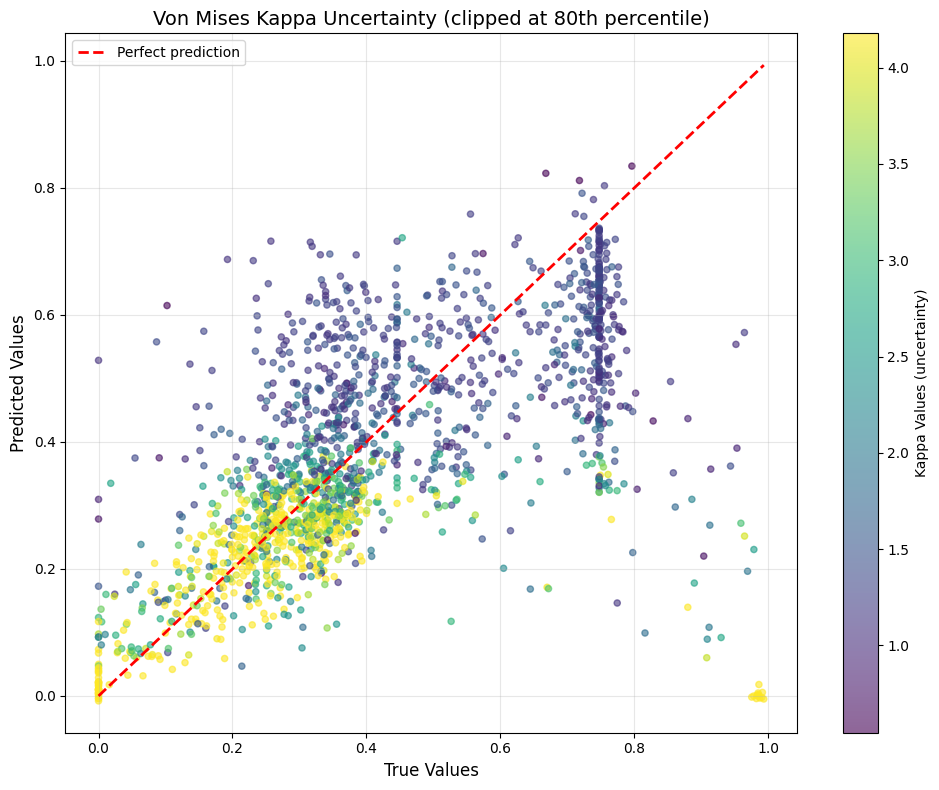

/tmp/ipykernel_9483/2361267201.py:47: RuntimeWarning: invalid value encountered in divide
  bars = ax.bar(bin_centers, mean_kappas, width=0.8/num_bins, yerr=std_kappas/np.sqrt(counts),


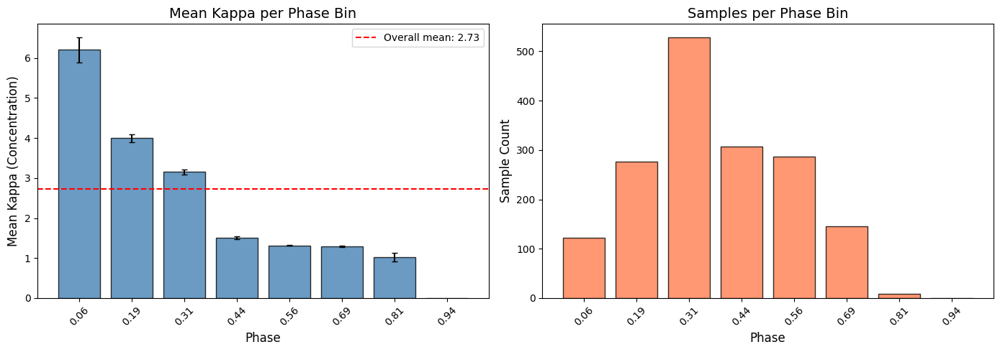


=== Kappa per Phase Bin Summary ===
Bin 0 [0.00-0.12]: mean κ=6.21 ± 3.53, n=122
Bin 1 [0.12-0.25]: mean κ=4.00 ± 1.57, n=277
Bin 2 [0.25-0.38]: mean κ=3.15 ± 1.33, n=529
Bin 3 [0.38-0.50]: mean κ=1.51 ± 0.51, n=307
Bin 4 [0.50-0.62]: mean κ=1.32 ± 0.24, n=287
Bin 5 [0.62-0.75]: mean κ=1.29 ± 0.22, n=145
Bin 6 [0.75-0.88]: mean κ=1.02 ± 0.34, n=9
Bin 7 [0.88-1.00]: mean κ=0.00 ± 0.00, n=0


In [58]:
from src.evaluation.plots import PlotGenerator, PlotConfig

plot_generator = PlotGenerator(config=PlotConfig())

# Clip kappas at 0.8 quantile
kappa_threshold = np.quantile(kappas, 0.8)
kappas_clipped = np.clip(kappas, None, kappa_threshold)

fig = plot_generator.von_mises_kappa_uncertainty_plot(labels, predictions, kappas_clipped, title="Von Mises Kappa Uncertainty (clipped at 80th percentile)")
plt.show()

# Bin phases and compute mean kappa per bin
num_bins = 8
labels_squeezed = predictions.squeeze()
kappas_squeezed = kappas.squeeze()

# Create bins from 0 to 1
bin_edges = np.linspace(0, 1, num_bins + 1)
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
bin_indices = np.digitize(labels_squeezed, bin_edges[:-1]) - 1
bin_indices = np.clip(bin_indices, 0, num_bins - 1)  # Handle edge cases

# Compute mean and std kappa per bin
mean_kappas = []
std_kappas = []
counts = []
for i in range(num_bins):
    mask = bin_indices == i
    if mask.sum() > 0:
        mean_kappas.append(np.mean(kappas_squeezed[mask]))
        std_kappas.append(np.std(kappas_squeezed[mask]))
        counts.append(mask.sum())
    else:
        mean_kappas.append(0)
        std_kappas.append(0)
        counts.append(0)

mean_kappas = np.array(mean_kappas)
std_kappas = np.array(std_kappas)
counts = np.array(counts)

# Plot mean kappa per phase bin
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Bar plot of mean kappa
ax = axes[0]
bars = ax.bar(bin_centers, mean_kappas, width=0.8/num_bins, yerr=std_kappas/np.sqrt(counts), 
              capsize=3, color='steelblue', edgecolor='black', alpha=0.8)
ax.set_xlabel('Phase', fontsize=12)
ax.set_ylabel('Mean Kappa (Concentration)', fontsize=12)
ax.set_title('Mean Kappa per Phase Bin', fontsize=14)
ax.set_xticks(bin_centers)
ax.set_xticklabels([f'{e:.2f}' for e in bin_centers], rotation=45)
ax.axhline(y=np.mean(kappas_squeezed), color='red', linestyle='--', label=f'Overall mean: {np.mean(kappas_squeezed):.2f}')
ax.legend()

# Sample count per bin
ax2 = axes[1]
ax2.bar(bin_centers, counts, width=0.8/num_bins, color='coral', edgecolor='black', alpha=0.8)
ax2.set_xlabel('Phase', fontsize=12)
ax2.set_ylabel('Sample Count', fontsize=12)
ax2.set_title('Samples per Phase Bin', fontsize=14)
ax2.set_xticks(bin_centers)
ax2.set_xticklabels([f'{e:.2f}' for e in bin_centers], rotation=45)

plt.tight_layout()
plt.show()

# Print summary
print("\n=== Kappa per Phase Bin Summary ===")
for i in range(num_bins):
    print(f"Bin {i} [{bin_edges[i]:.2f}-{bin_edges[i+1]:.2f}]: mean κ={mean_kappas[i]:.2f} ± {std_kappas[i]:.2f}, n={counts[i]}")